In [1]:
import numpy as np 
import cv2 
import matplotlib.pyplot as plt
import sys
%matplotlib inline

In [2]:
from pylab import rcParams
rcParams['figure.figsize'] = 25, 10

In [17]:
def find_nearest_above(my_array, target):
    diff = my_array - target
    mask = np.ma.less_equal(diff, -1)
    # We need to mask the negative differences
    # since we are looking for values above
    if np.all(mask):
        c = np.abs(diff).argmin()
        return c # returns min index of the nearest if target is greater than any value
    masked_diff = np.ma.masked_array(diff, mask)
    return masked_diff.argmin()

In [5]:
def gamma(img,gamma):
    
    # normalize between 0 and 1
    img = (img.astype(float))/255.0
    
    # apply gamma transformation
    img = (img**(1.0/gamma)) * 255
    
    return img.astype(int)

In [6]:
def helper(vec):
    bin_idx = vec
    count = np.zeros(256)
    values = np.arange(256)
    for i in vec:
        count[i] += 1
    return values, bin_idx, count
    

In [7]:
def hist_match(source, template):

    oldshape = source.shape
    source = source.flatten()
    template = template.flatten()
    
    # s_values : unique pixels intensity
    # s_counts : frequnecy of these intensities
    # bin_idx : inverse mapping from bin to pixel intensity
    s_values, bin_idx, s_counts = helper(source)
    t_values, faltu, t_counts = helper(template)
    
    # take CDF for both images
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]
    
    # Round the values
    sour = np.around(s_quantiles*255)
    temp = np.around(t_quantiles*255)
    # Map the rounded values
    b=[]
    
    for data in sour[:]:
        b.append(find_nearest_above(temp,data))
    b = np.array(b,dtype='uint8')
 
    return b[bin_idx].reshape(oldshape).astype(int)

In [8]:
img1 = cv2.imread('1.jpg',0)
img2 = cv2.imread('2.jpg',0)
img3 = cv2.imread('3.jpg',0)
img4 = cv2.imread('4.jpg',0)
img5 = cv2.imread('5.jpg',0)
img6 = cv2.imread('6.jpg',0)

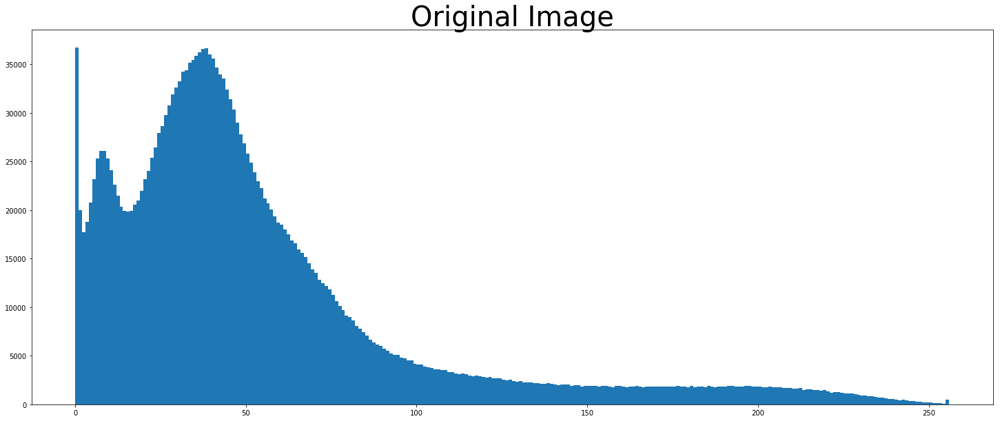

In [9]:
plt.hist(img3.ravel(),256,[0,256]) 
plt.title('Original Image',fontsize=40)
plt.show()

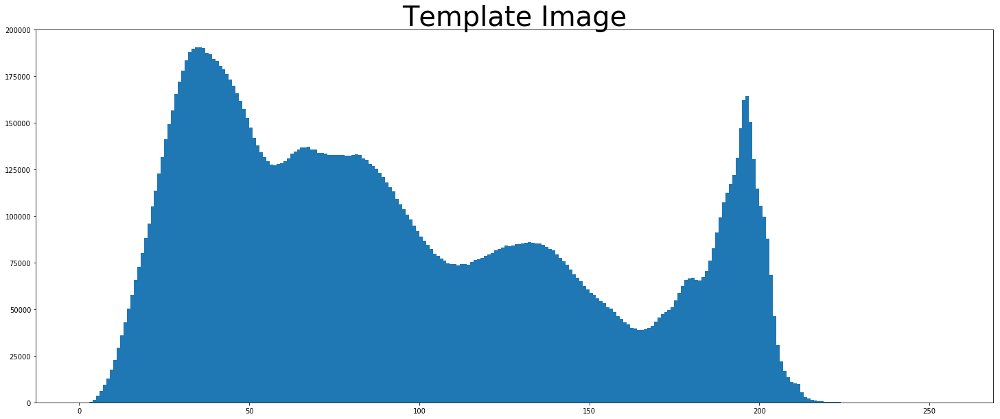

In [19]:
plt.hist(img2.ravel(),256,[0,256]) 
plt.title('Template Image',fontsize=40)
plt.show()

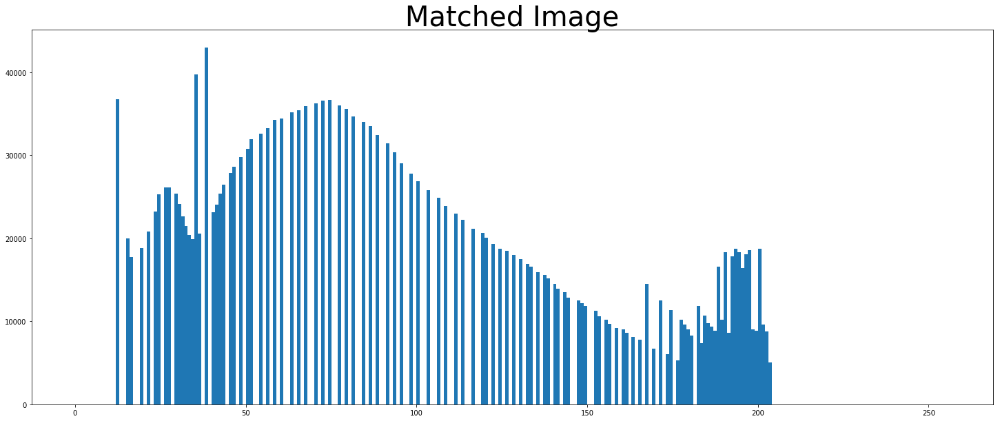

In [20]:
plt.hist(hist_match(img3,img2).ravel(),256,[0,256]) 
plt.title('Matched Image',fontsize=40)
plt.show()

# Histogram Specification

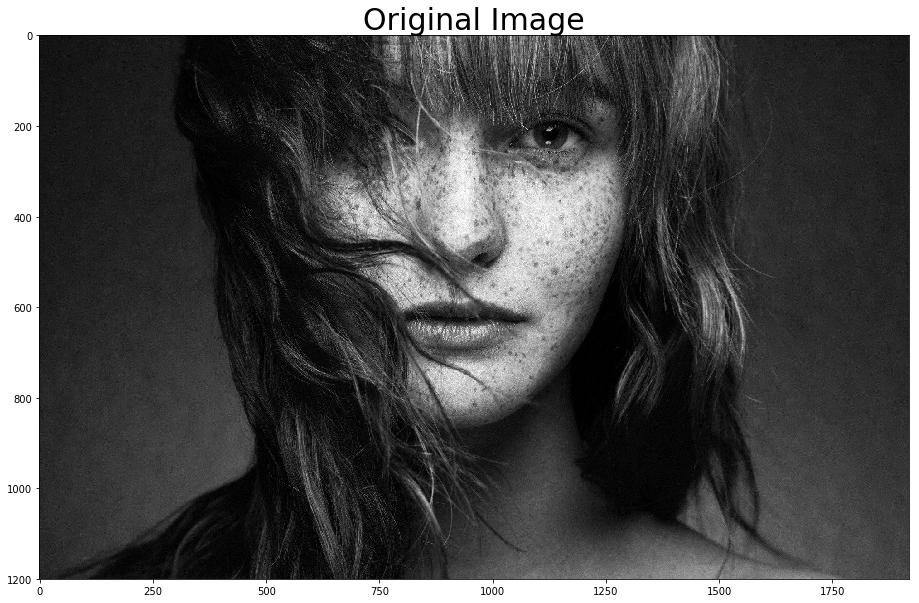

In [24]:
plt.imshow(img3,'gray')
plt.title("Original Image",fontsize=30)
plt.show()

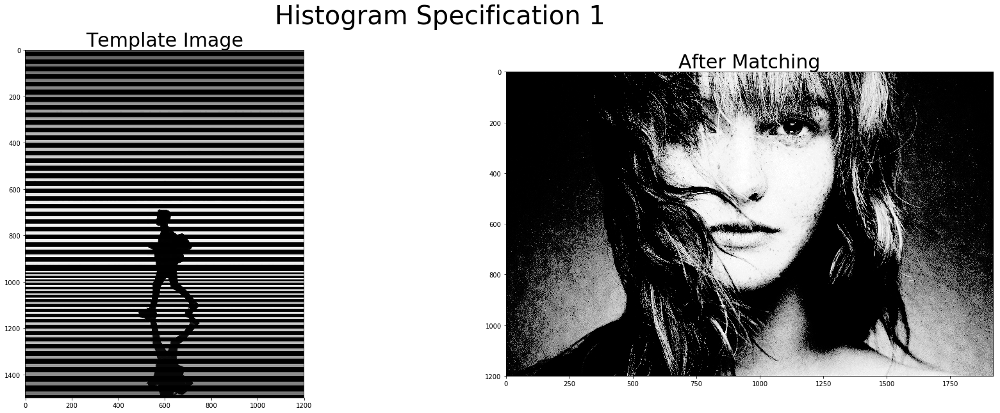

In [23]:
from pylab import rcParams
rcParams['figure.figsize'] = 30, 10

fig, (ax1, ax2) = plt.subplots(1,2)
fig.suptitle('Histogram Specification 1', fontsize=40)
ax1.set_title('Template Image', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im1 = ax1.imshow(img4, cmap='gray')
ax2.set_title('After Matching', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im2 = ax2.imshow(hist_match(img3,img4), cmap='gray')
plt.show()

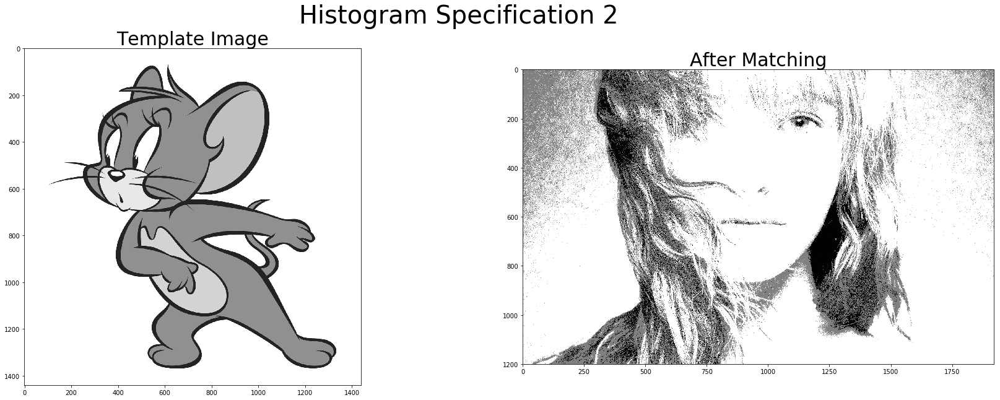

In [25]:
from pylab import rcParams
rcParams['figure.figsize'] = 30, 10

fig, (ax1, ax2) = plt.subplots(1,2)
fig.suptitle('Histogram Specification 2', fontsize=40)
ax1.set_title('Template Image', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im1 = ax1.imshow(img5, cmap='gray')
ax2.set_title('After Matching', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im2 = ax2.imshow(hist_match(img3,img5), cmap='gray')
plt.show()

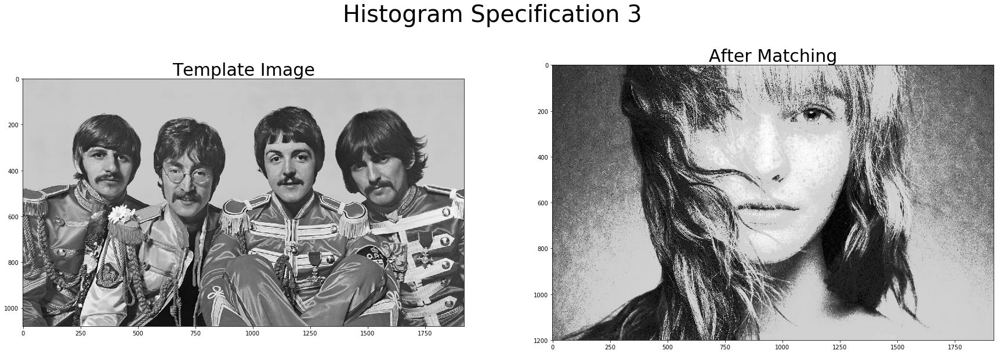

In [28]:
from pylab import rcParams
rcParams['figure.figsize'] = 30, 10

fig, (ax1, ax2) = plt.subplots(1,2)
fig.suptitle('Histogram Specification 3', fontsize=40)
ax1.set_title('Template Image', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im1 = ax1.imshow(img1, cmap='gray')
ax2.set_title('After Matching', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im2 = ax2.imshow(hist_match(img3,img1), cmap='gray')
plt.show()

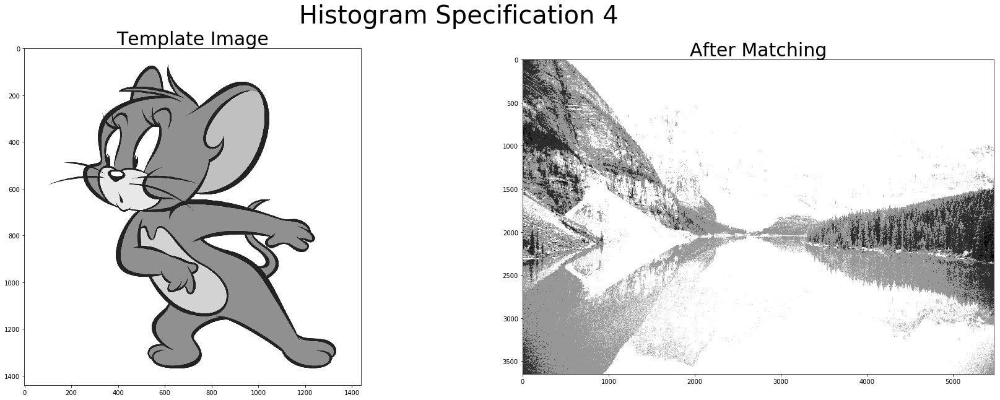

In [15]:
from pylab import rcParams
rcParams['figure.figsize'] = 30, 10

fig, (ax1, ax2) = plt.subplots(1,2)
fig.suptitle('Histogram Specification 4', fontsize=40)
ax1.set_title('Template Image', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im1 = ax1.imshow(img5, cmap='gray')
ax2.set_title('After Matching', fontsize=30)
# Display image, `aspect='auto'` makes it fill the whole `axes` (ax3)
im2 = ax2.imshow(hist_match(img2,img5), cmap='gray')
plt.show()

# Gamma Experiments

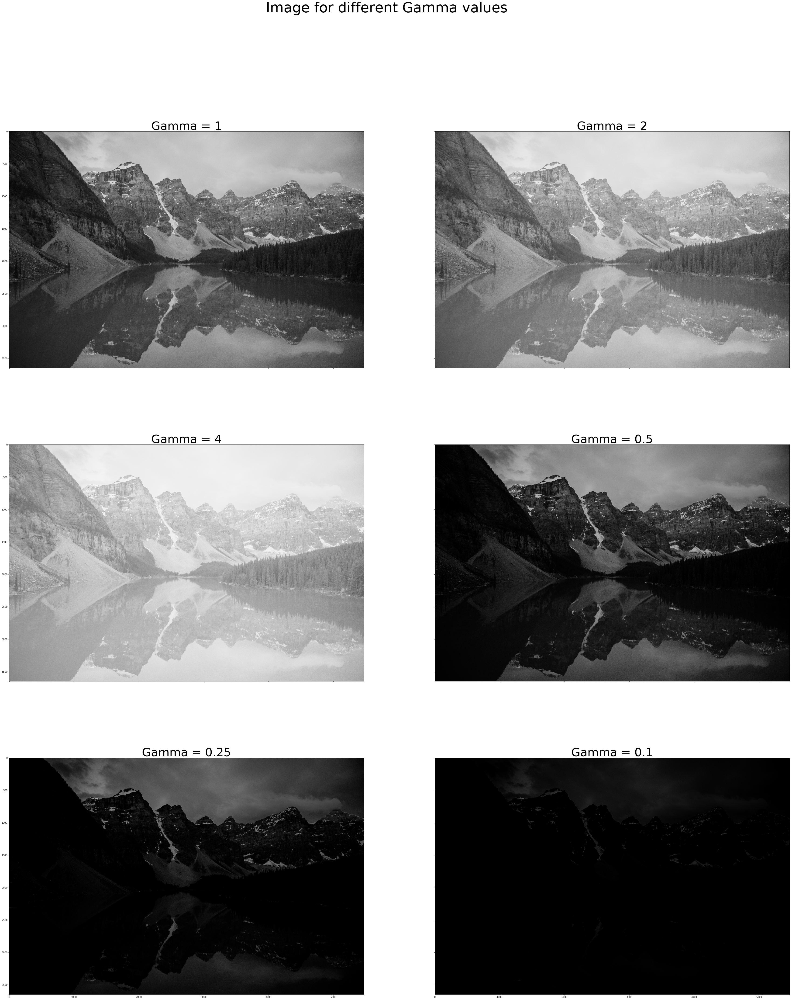

In [45]:
from pylab import rcParams
rcParams['figure.figsize'] = 60, 70

img = cv2.imread('2.jpg',0)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_array = []
title_array = ['1','2','4','0.5','0.25','0.1']
img_array.append(gamma(img,1))
img_array.append(gamma(img,2))
img_array.append(gamma(img,4))
img_array.append(gamma(img,0.5))
img_array.append(gamma(img,0.25))
img_array.append(gamma(img,0.1))
fig, ax = plt.subplots(3, 2, sharex='col', sharey='row')
fig.suptitle('Image for different Gamma values', fontsize=60)
for i in range(3):
    for j in range(2):
        ax[i, j].set_title('Gamma = ' + title_array[i*2+j], fontsize=50)
        ax[i, j].imshow(img_array[i*2+j])
plt.show()